In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.spatial.distance import cdist

import ot

import geomstats
from geomstats.geometry.spd_matrices import SPDMatrices

from dtmrpy import DT_GMM

from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score, LeaveOneOut

INFO: Using numpy backend


In [2]:
class dtgmm:
    def __init__(self, weights, locations):
        assert weights.shape[0] == locations.shape[0]
        self.weights = weights
        self.locations = locations
     
    def means_(self):
        return self.locations[:,:3]
    
    def covariances_(self):
        C = self.locations[:,3:]
        return np.array([C[:,0],C[:,1]/2,C[:,2]/2,C[:,1]/2,C[:,3],C[:,4]/2,C[:,2]/2,C[:,4]/2,C[:,5]]).T.reshape(-1,3,3)
        
    def plot_gmm(self):
        w = self.weights/max(self.weights)
        x,y,z = self.locations[:,0],self.locations[:,1],self.locations[:,2]
        c = np.array([self.locations[:,3],self.locations[:,6],self.locations[:,8]]).T
        c=c/(np.sum(c,1).reshape(-1,1))
 
        for i in range(w.shape[0]):
            plt.plot(x[i],y[i],z[i],'.',c=c[i],alpha = w[i])
            
        # plt.gca().scatter(x,y,z,s=8,c=c, alpha = w)

def DT_GMM_to_dtgmm(DT_GMM):
    w = DT_GMM.weights_.reshape(-1)
    weights = w/sum(w)
    
    x = DT_GMM.means_
    x = x-np.mean(x,0)
    cov_temp = geomstats.geometry.spd_matrices.SPDMatrices(3).projection(DT_GMM.covariances_)
    C = (cov_temp.reshape(-1,9)[:,np.array([0,1,2,4,5,8])])*(np.array([1,2,2,1,2,1]).reshape(1,-1))   
    locations = np.concatenate([x,C],1)
    
    return dtgmm(weights, locations)

def dtgmm_to_DT_GMM(dtgmm):
    weights_ = dtgmm.weights
    means_ = dtgmm.locations[:,:3]
    dtgmm.covariances_
    return DT_GMM(weights_,means_,covarinaces_)

In [3]:
class free_support_barycenter(dtgmm):
    
    def __init__(self,barycenter=None, N=200, lr=0.0000001):
        self.lr=lr #learning rate for weights update
        
        if barycenter==None:
            init_weights = np.ones(N)/N
            x = np.zeros(3)+np.random.normal(size=(N,3))
            cov_temp = geomstats.geometry.spd_matrices.SPDMatrices(3).random_point(N)
            C = (cov_temp.reshape(-1,9)[:,np.array([0,1,2,4,5,8])])*(np.array([1,2,2,1,2,1]).reshape(1,-1)) 
            init_locations = np.concatenate([x,C],1)
            
            super().__init__(init_weights, init_locations)
            self.N = N
        
        else:
            super().__init__(barycenter.weights, barycenter.locations)
            self.N = barycenter.weights.shape[0]
               
    def get_barycentric_projection_embedding(self, measures_list):
        self.M_list = [np.square(cdist(self.locations,measure.locations)) for measure in measures_list]
        #calculate optimal couplings and optimal dual variables
        result_list = [ot.emd(self.weights,measure.weights,self.M_list[i],log=True) for i, measure in enumerate(measures_list)]
        #store optimal couplings
        self.Pi_list = [result[0] for result in result_list]
        #store optimal dual variables - center_ot_dual can probably just be replaced with result[1]['u']-np.mean(result[1]['u'])
        self.alpha_list = [ot.lp.center_ot_dual(result[1]['u'],result[1]['v'])[0] for result in result_list]
        #calculate and store barycentric projection locations
        self.embedding = np.array([(measures_list[i].locations.T@self.Pi_list[i].T@np.diag(1/self.weights.reshape(-1))).T for i in range(len(measures_list))])

    def weights_update(self):
        #get subgradient
        alpha = np.mean(np.array(self.alpha_list),0)
        #calculate subgradient update
        a_star = self.weights+(self.lr*alpha.reshape(1,-1))
        #project a_star into (interior of) probability simplex
        a_star[a_star<0]=1e-8
        a = a_star/np.sum(a_star)

        return a.reshape(-1)
        
    def free_support_barycenter_update(self, measures_list):
        self.get_barycentric_projection_embedding(measures_list)
        self.locations = np.mean(self.embedding,0)
        self.weights = self.weights_update()
        # print(np.mean(np.square(np.linalg.norm(barycenter.pseudo_log(),axis=1))))
        
    def pseudo_log(self):
        #calculate vector field representations
        return (self.embedding - self.locations).reshape(-1,self.N*9)
    
    def fit(self, measures_list, K=10, plot_steps=False):
        
        for i in range(K):
            self.free_support_barycenter_update(measures_list)
            
            if plot_steps:
                plt.figure().add_subplot(projection='3d')
                barycenter.plot_gmm()
                plt.gca().view_init(35,135)
                plt.show()
        

In [4]:
df = np.load('D:/DTMRI/HCP/hcp_centered_full_MZ_removed.pkl', allow_pickle=True)

In [ ]:
df = df.dropna(subset=df.columns[2:-1],how='all').copy()
df.reset_index(inplace=True, drop=True)
df

In [6]:
tract = 'Fornix_L'
ind = df[tract].dropna().index

measure_list = list(df[tract][ind])
y = np.array((df['label'][ind]=='M').astype(int))

In [7]:
dtgmm_list = [DT_GMM_to_dtgmm(measure) for measure in measure_list][:100]

In [8]:
class measure_network():
    
    def __init__(self, weights, locations, sigma=1,eps=1e-15):
        self.weights = weights
        self.locations = locations
        self.D = cdist(self.locations,self.locations)
        
        self.eps=eps
        self.sigma = sigma 
        self.C = np.exp(-self.D ** 2 / (2 * self.sigma ** 2))
        
    def plot_graph(self):
        self.C = np.exp(-self.D ** 2 / (2 * self.sigma ** 2))
        # Plot nodes
        rgb = np.array([self.locations[:,3],self.locations[:,6],self.locations[:,8]])
        rgb = (abs(rgb)/(np.sum(abs(rgb),0))).T
        plt.gca().scatter(self.locations[:, 0], self.locations[:, 1], self.locations[:, 2], color=rgb, alpha = self.weights/max(self.weights))

        # Plot edges
        for i in range(self.C.shape[0]-1):
            if self.weights[i]>0:
                for j in range(i + 1, self.C.shape[0]):
                    if self.weights[j]>0 and self.C[i,j]>self.eps:
                        plt.plot([self.locations[i, 0], self.locations[j, 0]], [self.locations[i, 1], self.locations[j, 1]],[self.locations[i, 2], self.locations[j, 2]], color='gray', alpha=self.C[i, j])

        # i, j = np.tril_indices(self.C.shape[0], k=-1)
        # plt.plot(np.c_[self.locations[i, 1], self.locations[j, 1]].T, -np.c_[self.locations[i, 0], self.locations[j, 0]].T, color='gray', alpha=self.C[i, j])

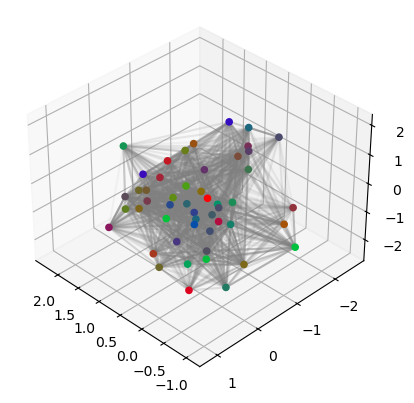

0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 

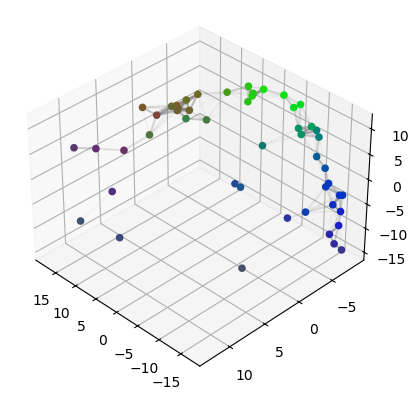

0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 

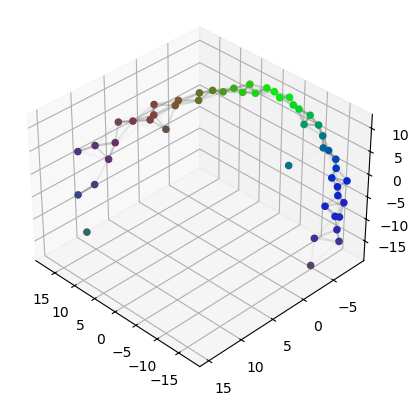

0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 

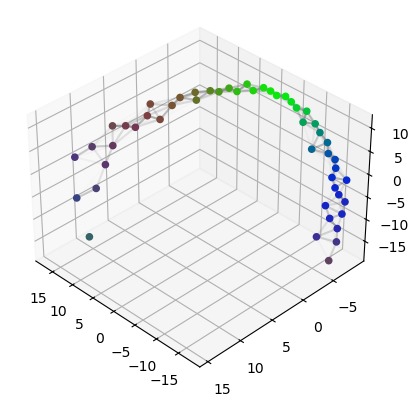

0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 

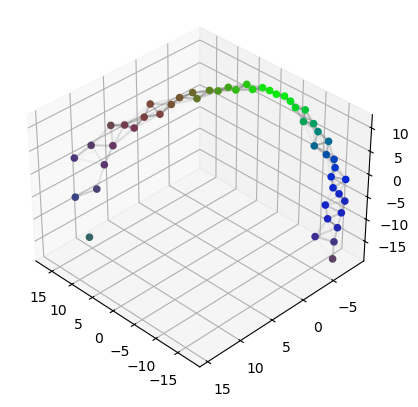

0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 

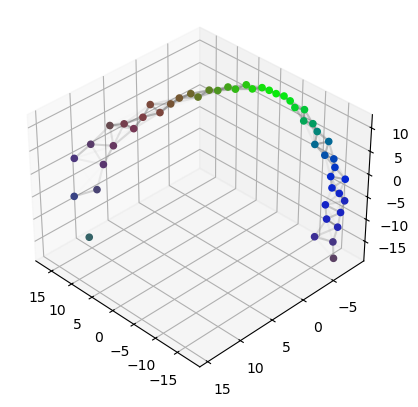

0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 

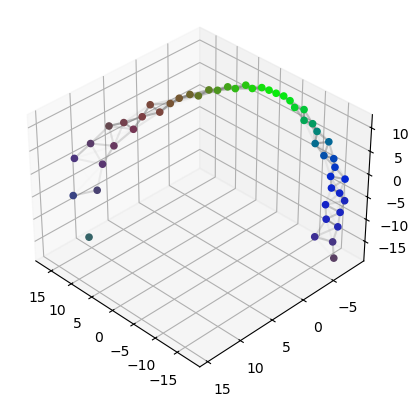

0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 

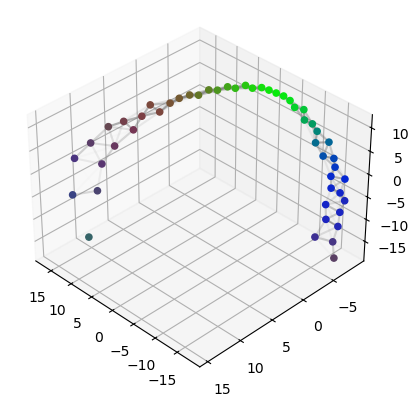

0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 

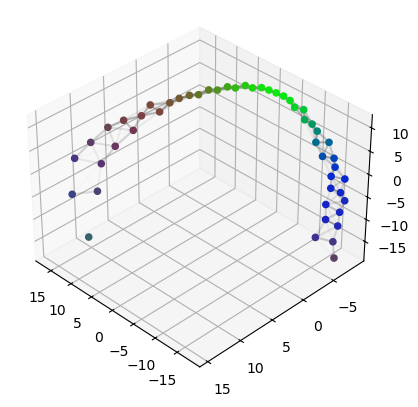

0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 

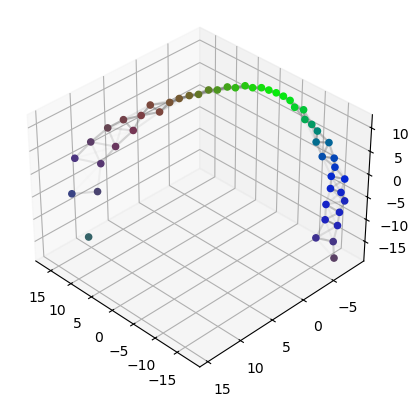

0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 

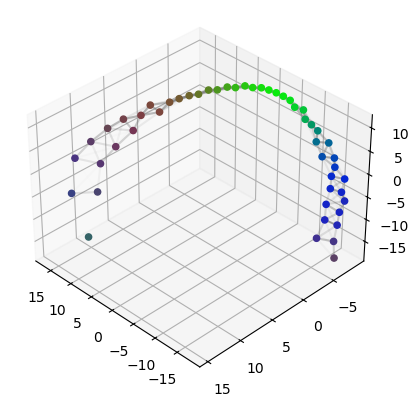

In [9]:
N=50
# mu0 = measure_network(barycenter.weights,barycenter.locations[:,:3],sigma=2)
mu0 = measure_network(np.ones(N)/N,np.zeros(9)+np.random.normal(size=(N,9)),sigma=2)

plt.figure().add_subplot(projection='3d')
mu0.plot_graph()
plt.gca().view_init(35,135)
plt.show()

for j in range(10):
    nodes = []
    edges = []

    a=mu0.weights
    A = mu0.D
    n=a.shape[0]
    
    for i0, measure_i in enumerate(dtgmm_list):
        print(i0, end=' ')
        
        mu1 = measure_network(measure_i.weights, measure_i.locations,sigma=2)

        b=mu1.weights
        B = mu1.D
        m=b.shape[0]

        gamma = ot.fused_gromov_wasserstein(cdist(mu0.locations,mu1.locations), A, B, a, b, 'square_loss', alpha=.5, tol_rel=1e-9)
            
        Tx = np.diag(1/a)@gamma@mu1.locations
        Te = np.einsum('ij,kl,jl->ik', gamma/a[:, None], gamma/a[:, None], B)

        nodes.append(Tx)                     
        edges.append(Te)

    T_node = np.array(nodes).mean(0)
    T_edge = np.array(edges).mean(0)

    mu0 = measure_network(mu0.weights,T_node,sigma=2)
    mu0.D = T_edge

    plt.figure().add_subplot(projection='3d')
    measure_network(mu0.weights,mu0.locations,sigma=2).plot_graph()
    plt.gca().view_init(35,135)
    plt.show()

In [24]:
np.save('fgw_barycenter.npy',mu0)

In [25]:
temp = np.load('fgw_barycenter.npy',allow_pickle=True)

In [ ]:
plt.figure(figsize=(18,6)).add_subplot(131,projection='3d')
measure_network(mu0.weights,mu0.locations,sigma=2).plot_graph()
plt.gca().view_init(35,135)

# plt.subplot(132,projection='3d')
# measure_network(dtgmm_list[0].weights,dtgmm_list[0].locations,sigma=4).plot_graph()
# plt.gca().view_init(35,135)

plt.subplot(133,projection='3d')
measure_network(mu0.weights,nodes[0],sigma=4).plot_graph()
plt.gca().view_init(35,135)

plt.show()

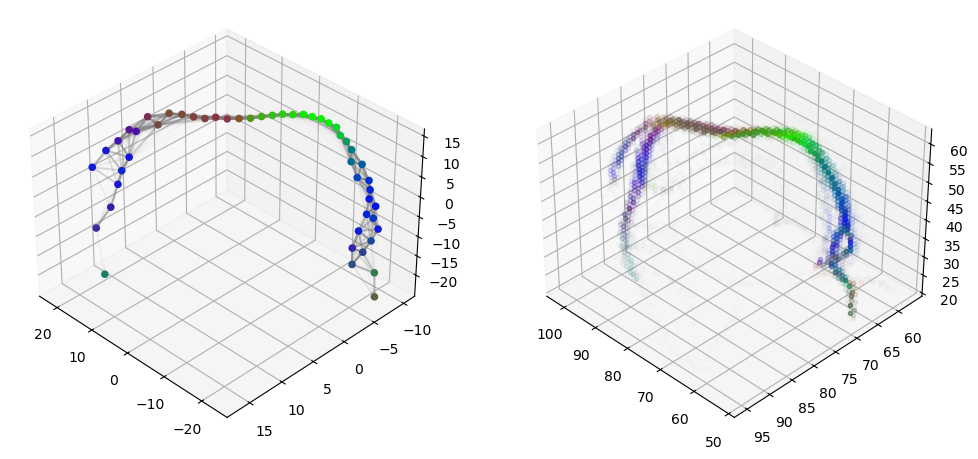

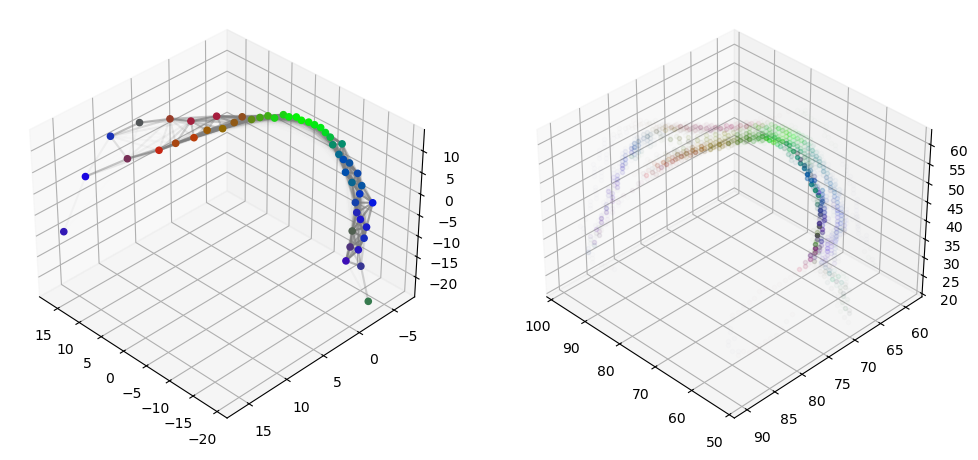

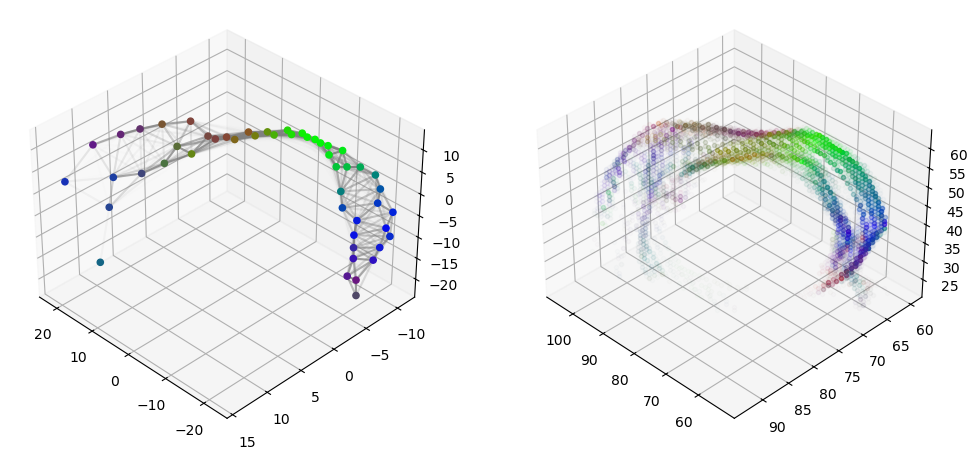

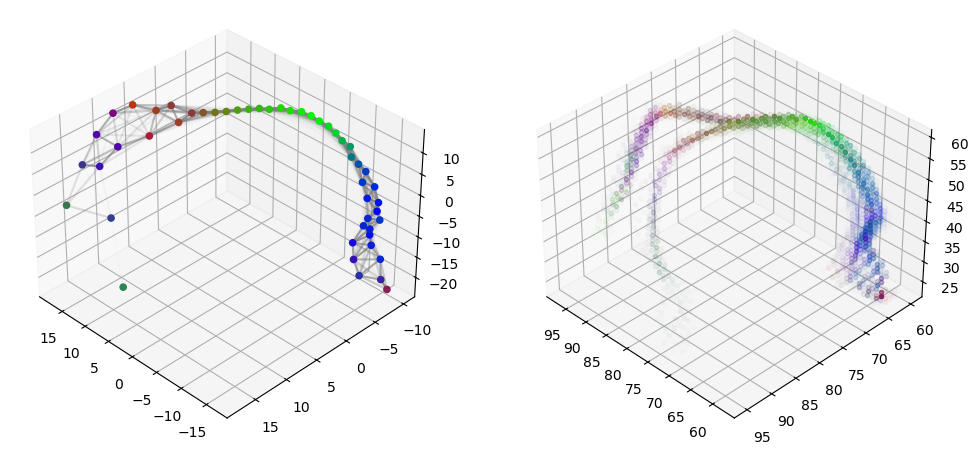

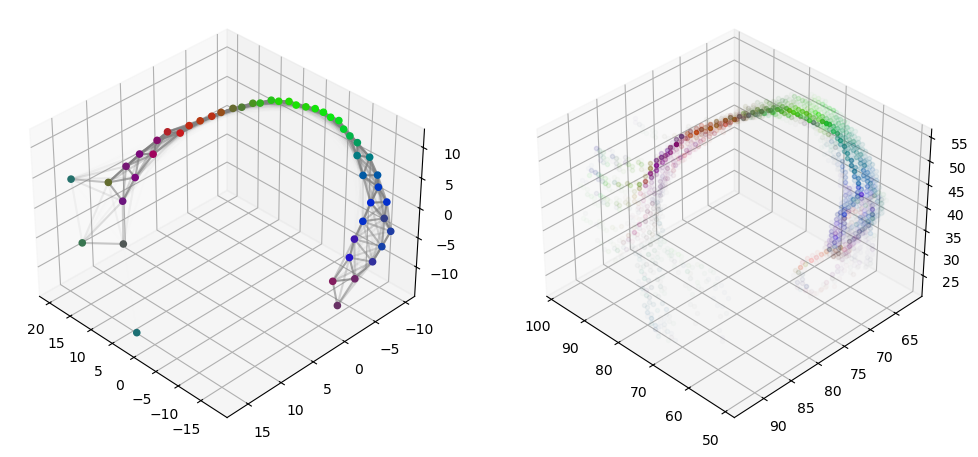

...

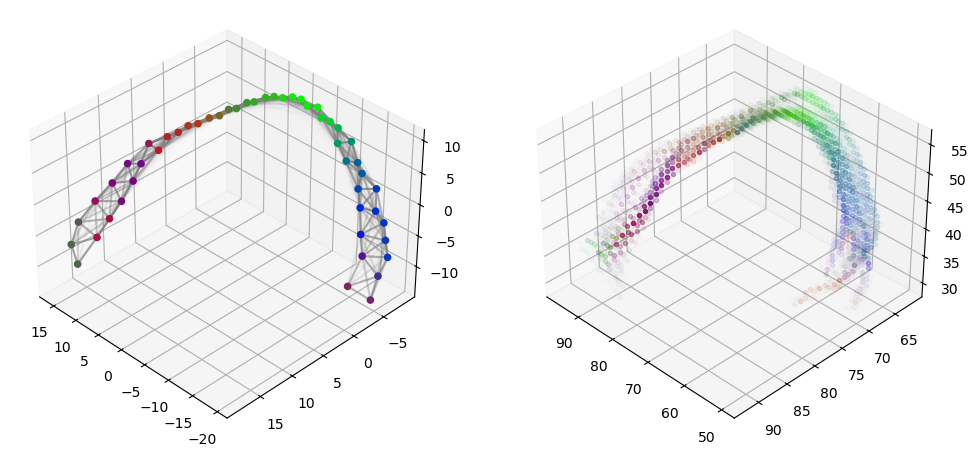

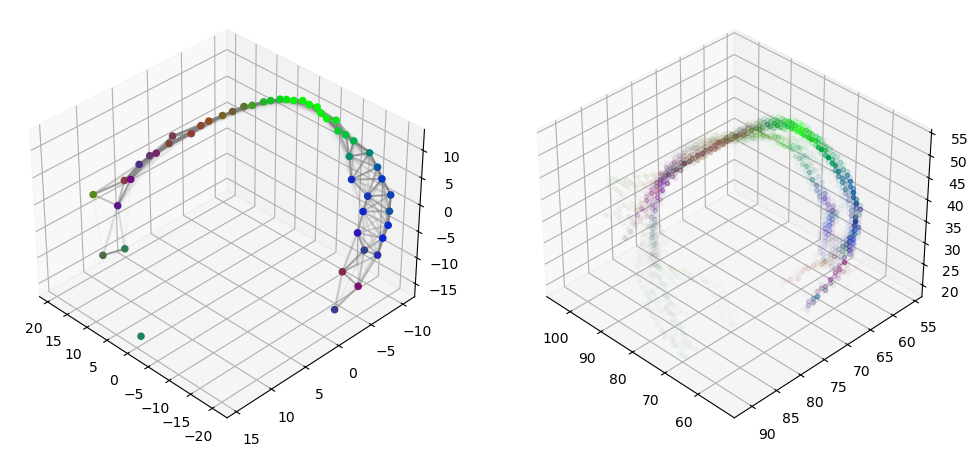

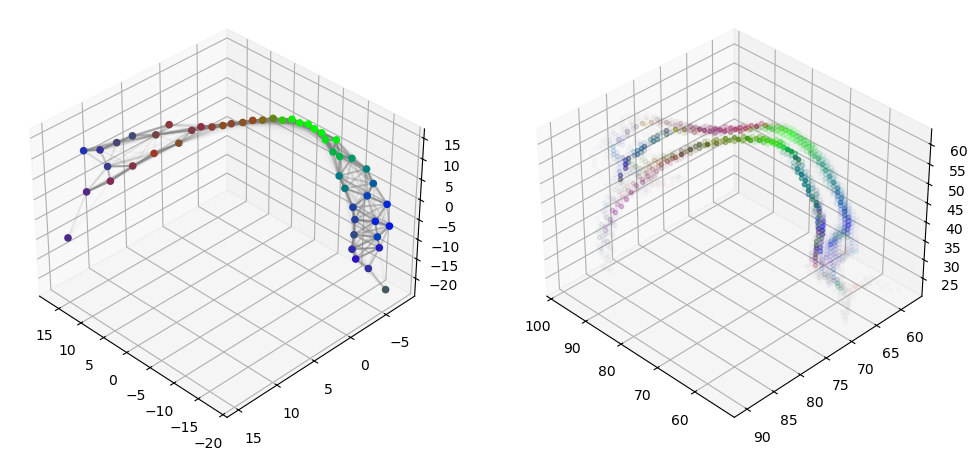

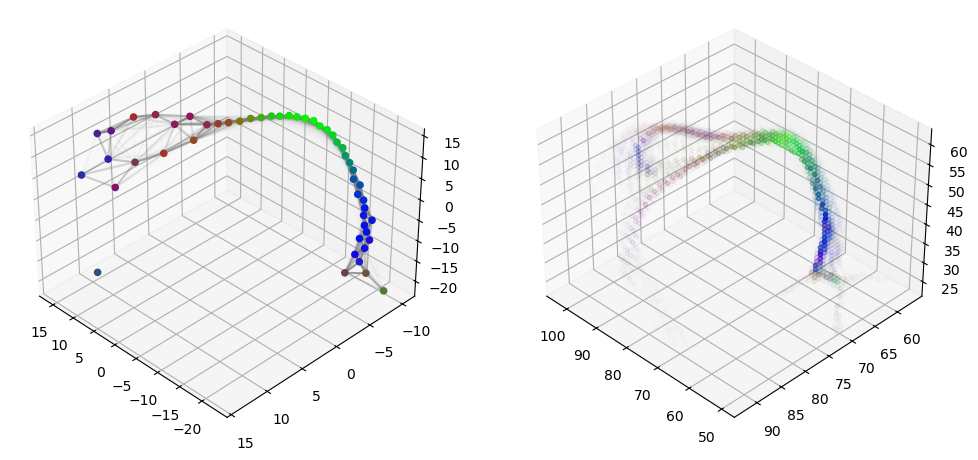

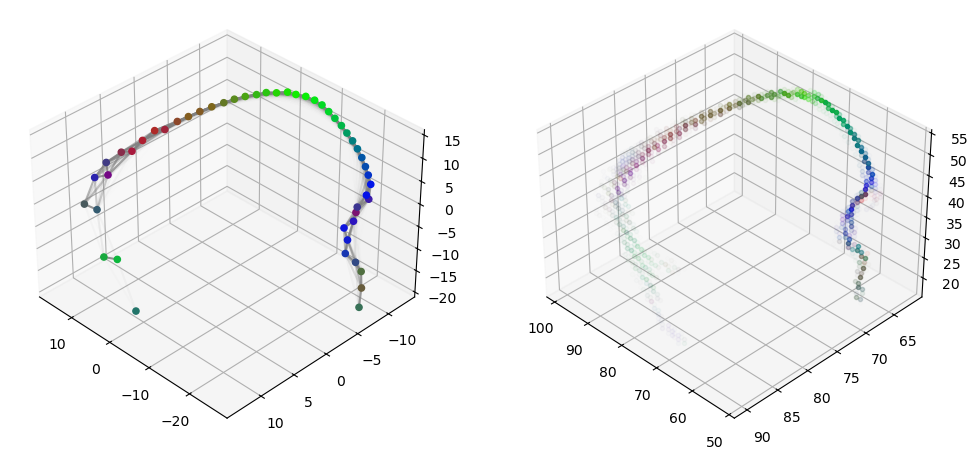

C:\Users\micha\Documents\GitHub\Research\DTMRI_2\dtmrpy\dtmrpy.py:91: RuntimeWarning: invalid value encountered in divide
  plt.plot(x,y,z,'.',c=rgb/sum(rgb), alpha = w[i][0])


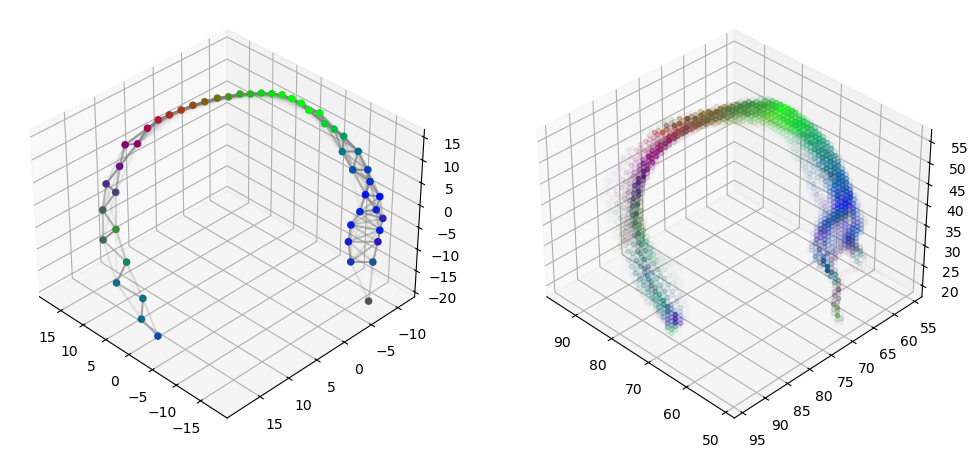

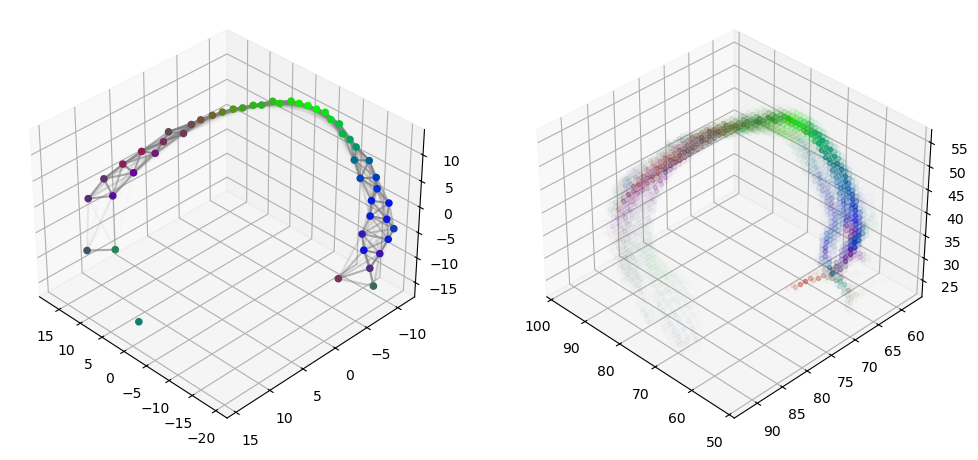

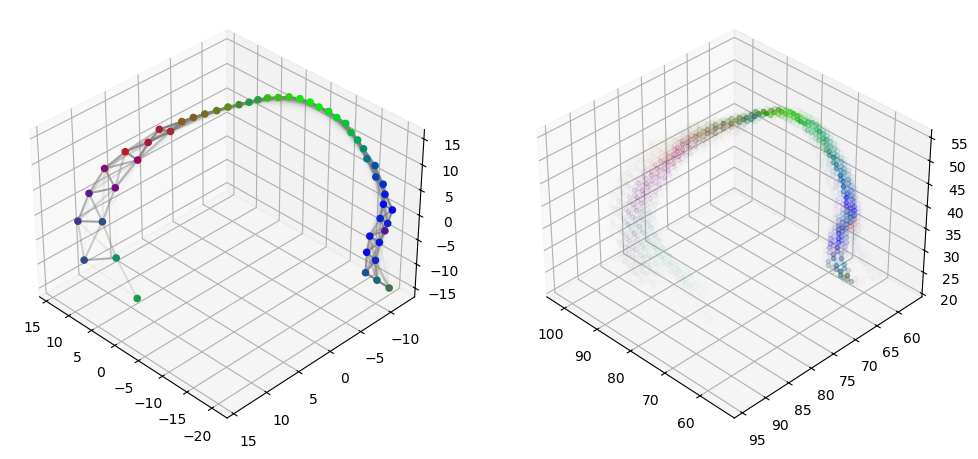

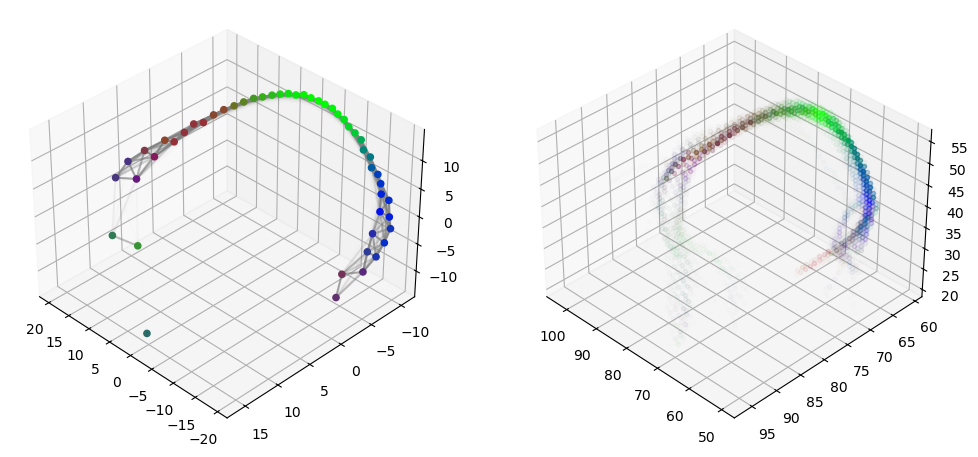

In [10]:
for i in range(50):
    
    plt.figure(figsize=(12,6)).add_subplot(121,projection='3d')
    measure_network(mu0.weights,nodes[i],sigma=4).plot_graph()
    plt.gca().view_init(35,135)
    
    plt.subplot(122, projection='3d')
    measure_list[i].plot()
    plt.gca().view_init(35,135)
    
    plt.show()

# plt.figure().add_subplot(projection='3d')
# measure_network(mu0.weights,nodes[1],sigma=2).plot_graph()
# plt.gca().view_init(35,135)
# plt.show()

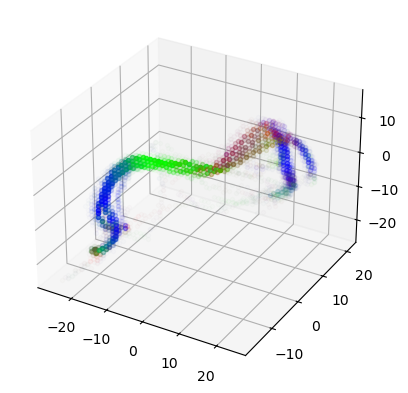

In [30]:
plt.figure().add_subplot(projection='3d')
dtgmm_list[0].plot_gmm()

In [31]:
mu = dtgmm_list[0]

In [33]:
from sklearn.cluster import KMeans

(1934, 9)

In [13]:
from scipy.spatial.distance import cdist
import numpy as np

A = np.random.normal(size=(1000,9))
B = np.random.normal(size=(1000,9))

In [14]:
%%timeit
cdist(A,B)



6.55 ms ± 103 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)
